# XAI-Analytics Example Notebook

In [1]:
import os
import xai
import logging as log 
import warnings
import matplotlib.pyplot as plt

from util.commons import *
from util.ui import *
from util.model import *
from util.split import *
from util.dataset import *
from IPython.display import display, HTML

/home/g3no/github/XAI-Analytics/venv/lib/python3.8/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)
/home/g3no/github/XAI-Analytics/venv/lib/python3.8/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


## Load a dataset
For this example we are going to use 'Adult Census Dataset'. It consists of both categorical and numerical features.
In the output of the cell below, we can see the first five elements (*head*) of the dataset.

In [2]:
dataset, msg = get_dataset('census')

20-Jun-20 15:56:14 - Dataset 'census (Adult census dataset)' loaded successfully. For further information about this dataset please visit: https://ethicalml.github.io/xai/index.html?highlight=load_census#xai.data.load_census
20-Jun-20 15:56:14 - 
   age          workclass   education  education-num       marital-status  \
0   39          State-gov   Bachelors             13        Never-married   
1   50   Self-emp-not-inc   Bachelors             13   Married-civ-spouse   
2   38            Private     HS-grad              9             Divorced   
3   53            Private        11th              7   Married-civ-spouse   
4   28            Private   Bachelors             13   Married-civ-spouse   

           occupation    relationship ethnicity   gender  capital-gain  \
0        Adm-clerical   Not-in-family     White     Male          2174   
1     Exec-managerial         Husband     White     Male             0   
2   Handlers-cleaners   Not-in-family     White     Male            

## Visualize the dataset
There are a lot of data visualisation techniques that can be used to analyze a dataset. In this example we will use three functions offered by the [XAI](https://github.com/EthicalML/XAI) module.
* The first one shows the imbalances of selected features. In the first plot below, for example, we can see that the majority of samples (people) are *white* *male* (gender='Male', ethnicity='White').
* The second and third plots show correlations between the features. The second one plots the correlations as a matrix, whereas the third one as a hierarchical dendogram. 

20-Jun-20 15:56:14 - No categorical_cols passed so inferred using np.object, np.int8 and np.bool: Index(['workclass', 'education', 'marital-status', 'occupation',
       'relationship', 'ethnicity', 'gender', 'loan'],
      dtype='object'). If you see an error these are not correct, please provide them as a string array as: categorical_cols=['col1', 'col2', ...]


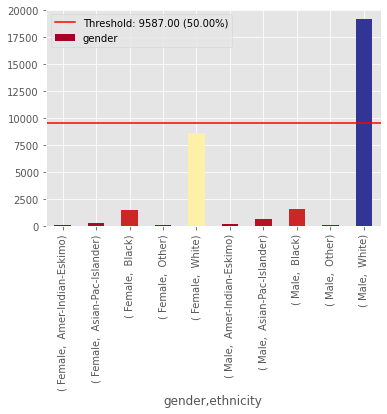

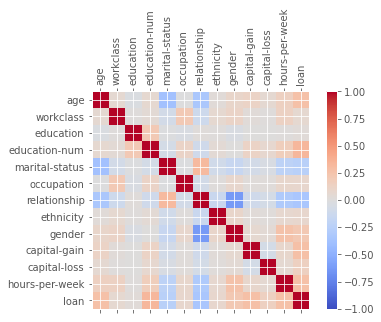

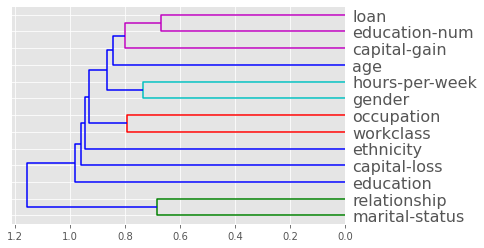

array([[ 1.        ,  0.05821793, -0.02753357,  0.06634497, -0.37484987,
        -0.00480952, -0.32151467,  0.02818017,  0.10037342,  0.12494799,
         0.05848388,  0.14290681,  0.27296206],
       [ 0.05821793,  1.        ,  0.00970422,  0.04002668, -0.07084739,
         0.20712561, -0.11564865,  0.06361613,  0.11274998,  0.03068833,
         0.01345492,  0.13366052,  0.06434877],
       [-0.02753357,  0.00970422,  1.        ,  0.20983273, -0.01332109,
        -0.03429336,  0.01642285,  0.01056352, -0.03450412,  0.00535775,
         0.00706282,  0.01060243,  0.0296483 ],
       [ 0.06634497,  0.04002668,  0.20983273,  1.        , -0.06440846,
         0.11508002, -0.0961136 ,  0.04588328,  0.00628315,  0.11913972,
         0.0747487 ,  0.16721512,  0.32968229],
       [-0.37484987, -0.07084739, -0.01332109, -0.06440846,  1.        ,
        -0.01187525,  0.31430555, -0.0868448 , -0.1542957 , -0.07642508,
        -0.04317161, -0.21222622, -0.23640271],
       [-0.00480952,  0.207125

In [3]:
%matplotlib inline
plt.style.use('ggplot')
warnings.filterwarnings('ignore')

imbalanced_cols = ['gender', 'ethnicity']

xai.imbalance_plot(dataset.df, *imbalanced_cols)
xai.correlations(dataset.df, include_categorical=True, plot_type="matrix")
xai.correlations(dataset.df, include_categorical=True)

## Target
In the cell below the target variable is selected. In this example we will use the column *loan* as target variable, which shows whether a person earns more than 50k per year. The features are split into a different dataframe.

In [4]:
df_X, df_y, msg = split_feature_target(dataset.df, "loan")
df_y

20-Jun-20 15:56:17 - Target 'loan' selected successfully.


0         <=50K
1         <=50K
2         <=50K
3         <=50K
4         <=50K
          ...  
32556     <=50K
32557      >50K
32558     <=50K
32559     <=50K
32560      >50K
Name: loan, Length: 32561, dtype: object

## Training the models
In this step three models are going to be trained on this dataset. All of them will be trained on the raw dataset (without any preprocessing). In the output below we could see classification reports for the trained models. The second model achieves the highest accuracity of *~0.84*.
 * Model 1: Logistic Regression
 * Model 2: Random Forest
 * Model 3: Decision Tree

In [5]:
# Create three empty models
initial_models, msg = fill_empty_models(df_X, df_y, 3)
models = []

# Train model 1
model1 = initial_models[0]
msg = fill_model(model1, Algorithm.LOGISTIC_REGRESSION, Split(SplitTypes.IMBALANCED, None))
models.append(model1)

# Train model 2
model2 = initial_models[1]
msg = fill_model(model2, Algorithm.RANDOM_FOREST, Split(SplitTypes.IMBALANCED, None))
models.append(model2)

# Train model 3
model3 = initial_models[2]
msg = fill_model(model3, Algorithm.DECISION_TREE, Split(SplitTypes.IMBALANCED, None))
models.append(model3)

20-Jun-20 15:56:18 - Model accuracy: 0.8028457365134609
20-Jun-20 15:56:20 - Classification report: 
              precision    recall  f1-score   support

       <=50K       0.94      0.79      0.86      7414
        >50K       0.56      0.84      0.67      2355

    accuracy                           0.80      9769
   macro avg       0.75      0.82      0.77      9769
weighted avg       0.85      0.80      0.81      9769

20-Jun-20 15:56:21 - Model Model 1 trained successfully!
20-Jun-20 15:56:38 - Model accuracy: 0.8417442931722796
20-Jun-20 15:56:39 - Classification report: 
              precision    recall  f1-score   support

       <=50K       0.89      0.91      0.90      7414
        >50K       0.69      0.64      0.66      2355

    accuracy                           0.84      9769
   macro avg       0.79      0.77      0.78      9769
weighted avg       0.84      0.84      0.84      9769

20-Jun-20 15:56:40 - Model Model 2 trained successfully!
20-Jun-20 15:56:42 - Model acc

## Global model interpretations
In the following steps we will use global interpretation techniques that help us to answer questions like how does a model behave in general? What features drive predictions and what features are completely useless. This data may be very important in understanding the model better. Most of the techniques work by investigating the conditional interactions between the target variable and the features on the complete dataset.

### Feature importance
The importance of a feature is the increase in the prediction error of the model after we permuted the feature’s values, which breaks the relationship between the feature and the true outcome. A feature is “important” if permuting it increases the model error. This is because in that case, the model relied heavily on this feature for making right prediction. On the other hand, a feature is “unimportant” if permuting it doesn’t affect the error by much or doesn’t change it at all.

In the first case, we use [ELI5](https://github.com/TeamHG-Memex/eli5), which does not permute the features but only visualizes the weight of each feature. From the graphics we see, for instance, that *marital-status=Married-civ-spouse* plays an important role in all three models. In *Model 2* and *Model 3* *age* has a 'heavy' weight.

In [6]:
for model in models:
    plot = generate_feature_importance_plot("ELI5", model)
    display(plot)

20-Jun-20 15:56:44 - Generating a feature importance plot using ELI5 for Model 1 ...


20-Jun-20 15:56:45 - Generating a feature importance plot using ELI5 for Model 2 ...


Weight,Feature
0.2138 ± 0.0661,age
0.1100 ± 0.0253,hours-per-week
0.1015 ± 0.2132,marital-status_ Married-civ-spouse
0.0747 ± 0.0314,capital-gain
0.0700 ± 0.0666,education-num
0.0586 ± 0.1571,relationship_ Husband
0.0373 ± 0.1088,marital-status_ Never-married
0.0241 ± 0.0110,capital-loss
0.0196 ± 0.0688,relationship_ Own-child
0.0173 ± 0.0213,occupation_ Exec-managerial


20-Jun-20 15:56:45 - Generating a feature importance plot using ELI5 for Model 3 ...


Weight,Feature
0.2937,marital-status_ Married-civ-spouse
0.1694,age
0.1101,education-num
0.0979,capital-gain
0.0892,hours-per-week
0.0280,capital-loss
0.0145,workclass_ Private
0.0093,occupation_ Exec-managerial
0.0091,workclass_ Self-emp-not-inc
0.0091,occupation_ Prof-specialty


In this step we use the [Skater](https://github.com/oracle/Skater) module, which permutes the features to generate a feature importance plot. From the plots below we can see that different features are important for the different models, despite of the fact that all models were trained on the same dataset.

20-Jun-20 15:56:48 - Generating a feature importance plot using SKATER for Model 1 ...
20-Jun-20 15:56:48 - Initializing Skater - generating new in-memory model. This operation may be time-consuming so please be patient.
2020-06-20 15:57:13,051 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progress_bar=False


[65/65] features ████████████████████ Time elapsed: 23 seconds

20-Jun-20 15:57:37 - Generating a feature importance plot using SKATER for Model 2 ...
20-Jun-20 15:57:37 - Initializing Skater - generating new in-memory model. This operation may be time-consuming so please be patient.
2020-06-20 15:57:59,542 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progress_bar=False


[65/65] features ████████████████████ Time elapsed: 34 seconds

20-Jun-20 15:58:34 - Generating a feature importance plot using SKATER for Model 3 ...
20-Jun-20 15:58:34 - Initializing Skater - generating new in-memory model. This operation may be time-consuming so please be patient.
2020-06-20 15:58:57,472 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progress_bar=False


[65/65] features ████████████████████ Time elapsed: 30 seconds

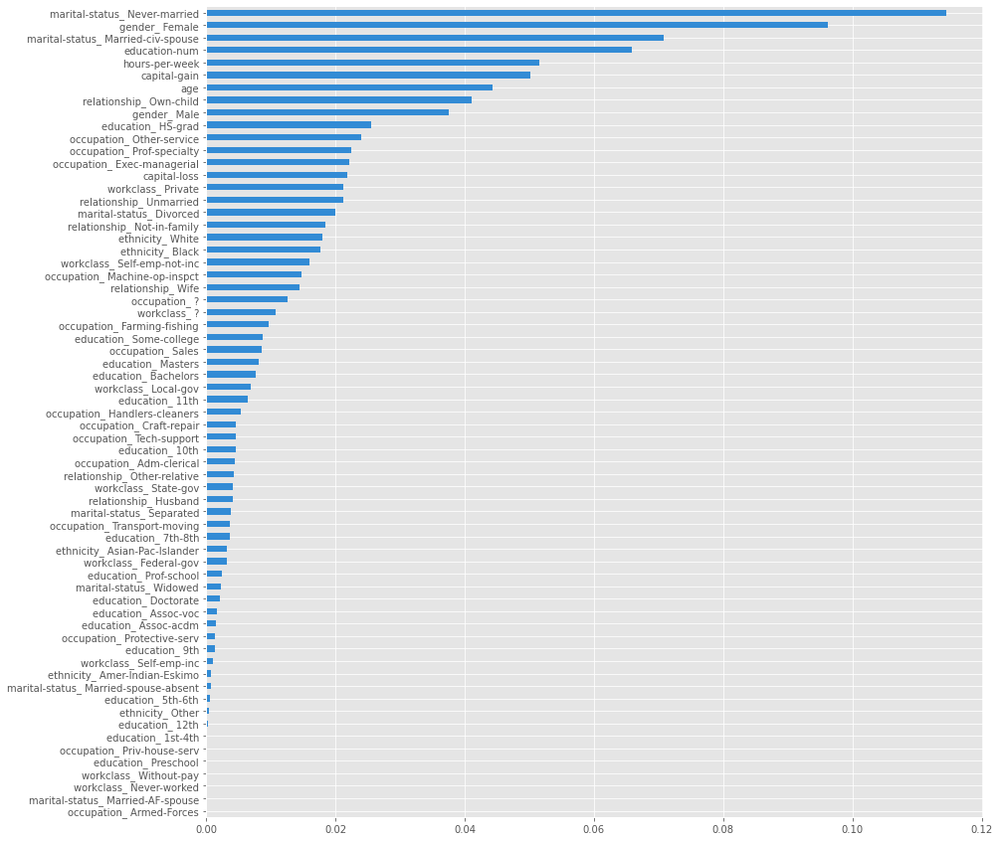

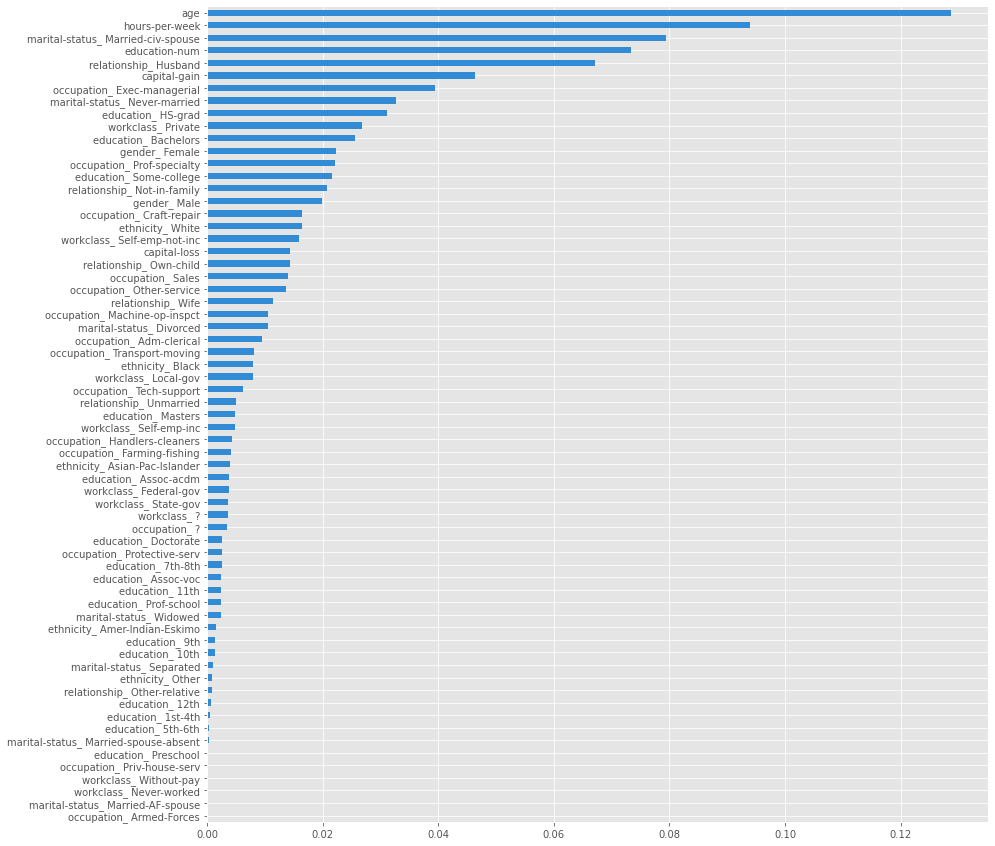

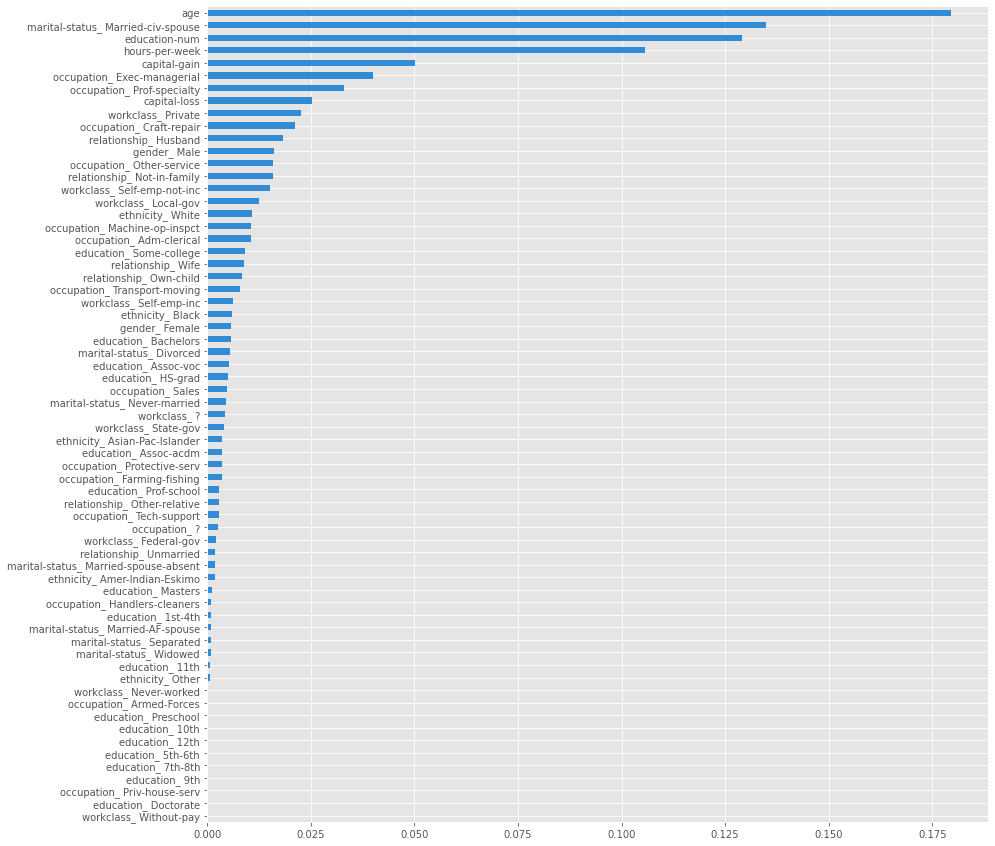

In [7]:
%matplotlib inline
plt.rcParams['figure.figsize'] = [14, 15]
plt.style.use('ggplot')
warnings.filterwarnings('ignore')

for model in models:
    _ = generate_feature_importance_plot("SKATER", model)

In the cell below we use the [SHAP](https://github.com/slundberg/shap) (SHapley Additive exPlanations). It uses a combination of feature contributions and game theory to come up with SHAP values. Then, it computes the global feature importance by taking the average of the SHAP value magnitudes across the dataset.

20-Jun-20 15:59:35 - Generating a feature importance plot using SHAP for Model 1 ...
20-Jun-20 15:59:35 - Initializing Shap - calculating shap values. This operation is time-consuming so please be patient.


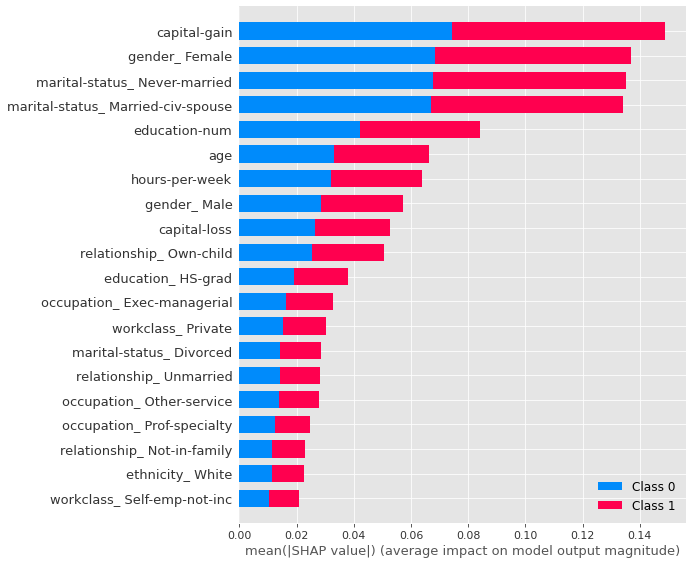

20-Jun-20 16:20:28 - Generating a feature importance plot using SHAP for Model 2 ...
20-Jun-20 16:20:28 - Initializing Shap - calculating shap values. This operation is time-consuming so please be patient.


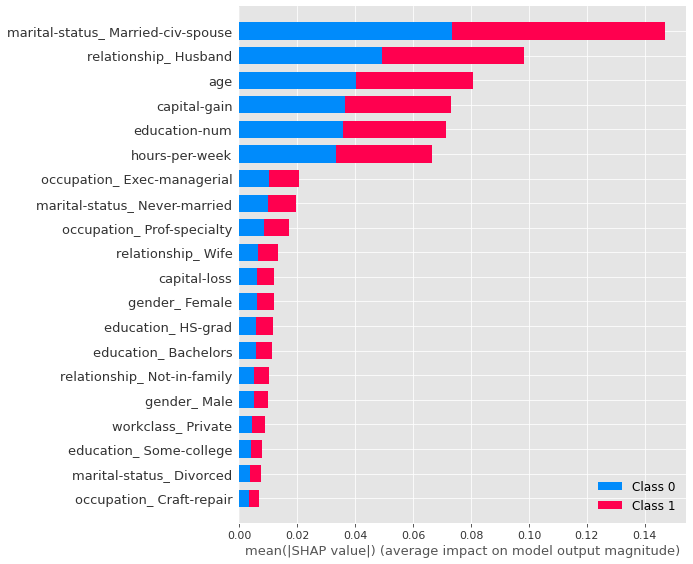

20-Jun-20 16:58:06 - Generating a feature importance plot using SHAP for Model 3 ...
20-Jun-20 16:58:06 - Initializing Shap - calculating shap values. This operation is time-consuming so please be patient.


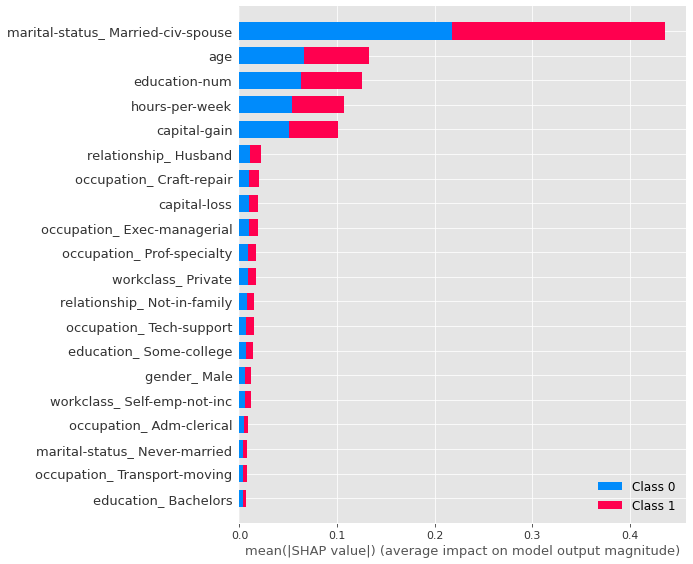

In [8]:
from shap import initjs
initjs()

%matplotlib inline
plt.style.use('ggplot')
warnings.filterwarnings('ignore')

for model in models:
    generate_feature_importance_plot("SHAP", model)

In the examples above, we have used three different techniques for representing the feature importance of a model. We can see that there is a slight difference in the results, due to the different approaches that each module uses. The training algorithms also contribute to these reuslts. Two features that, in particular, stand out are **age** and **education-num**. Therefore, these two will later be used in the Partial Dependence Plots

### Partial Dependence Plots
The partial dependence plot (short PDP or PD plot) shows the marginal effect one or two features have on the predicted outcome of a machine learning model. A partial dependence plot can show whether the relationship between the target and a feature is linear, monotonic or more complex. For example, when applied to a linear regression model, partial dependence plots always show a linear relationship.

[PDPBox](https://github.com/SauceCat/PDPbox) is the first module that we use for ploting partial dependence. We will generate two plots, one for only one feature - **age** and one for two features - **age** and **education-num**.

20-Jun-20 17:23:43 - Generating a PDP plot using PDPBox for Model 1 ...
20-Jun-20 17:23:59 - Generating a PDP plot using PDPBox for Model 1 ...
20-Jun-20 17:24:00 - Generating a PDP plot using PDPBox for Model 2 ...
20-Jun-20 17:24:17 - Generating a PDP plot using PDPBox for Model 2 ...
20-Jun-20 17:24:29 - Generating a PDP plot using PDPBox for Model 3 ...
20-Jun-20 17:24:46 - Generating a PDP plot using PDPBox for Model 3 ...
20-Jun-20 17:24:47 - findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
20-Jun-20 17:24:47 - findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
20-Jun-20 17:24:47 - findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
20-Jun-20 17:24:48 - findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


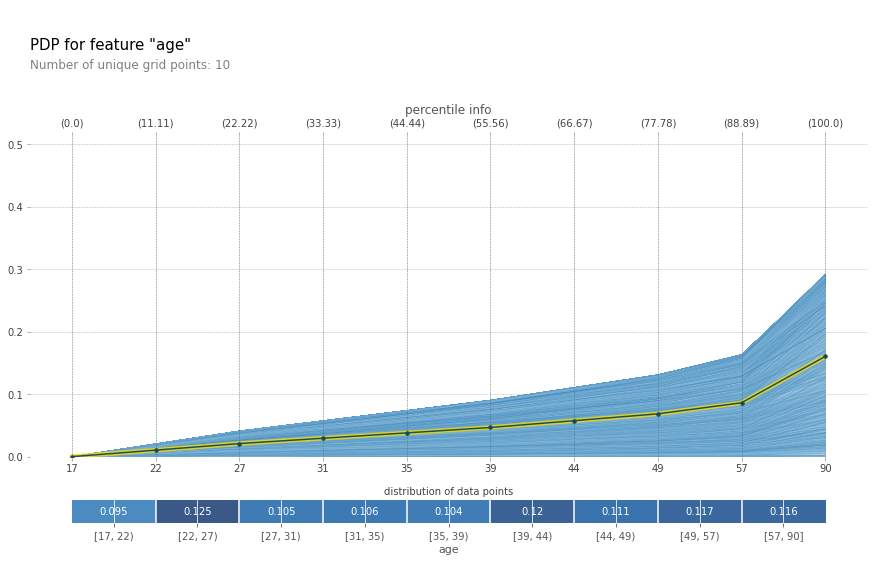

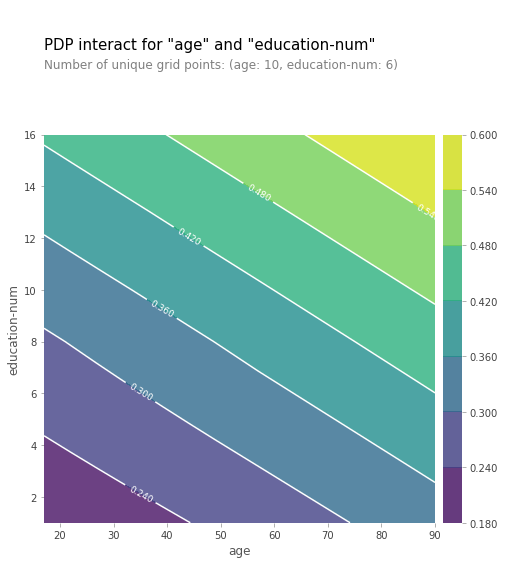

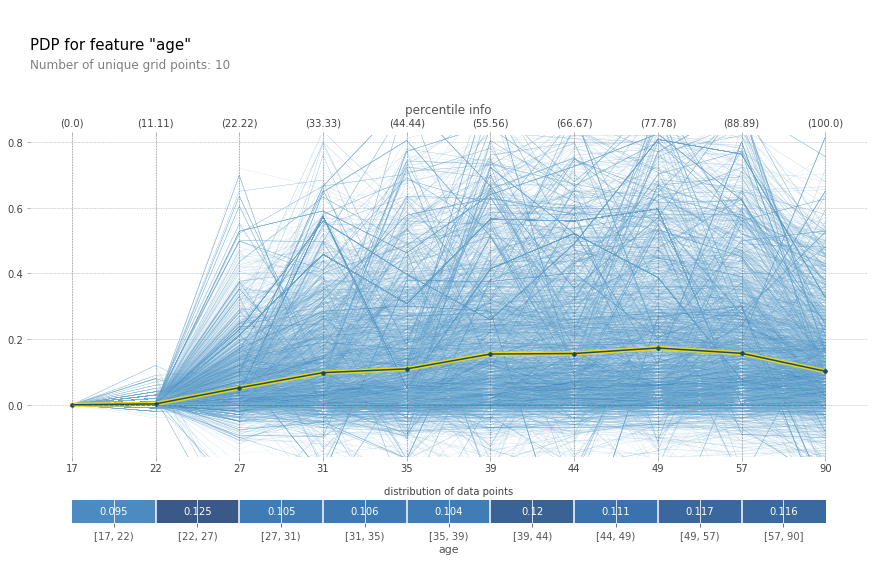

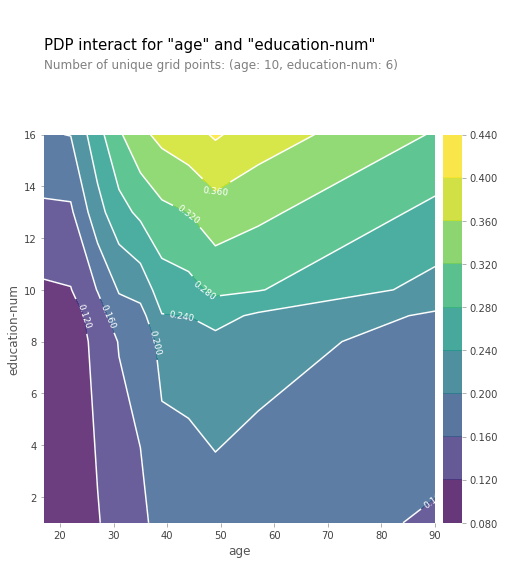

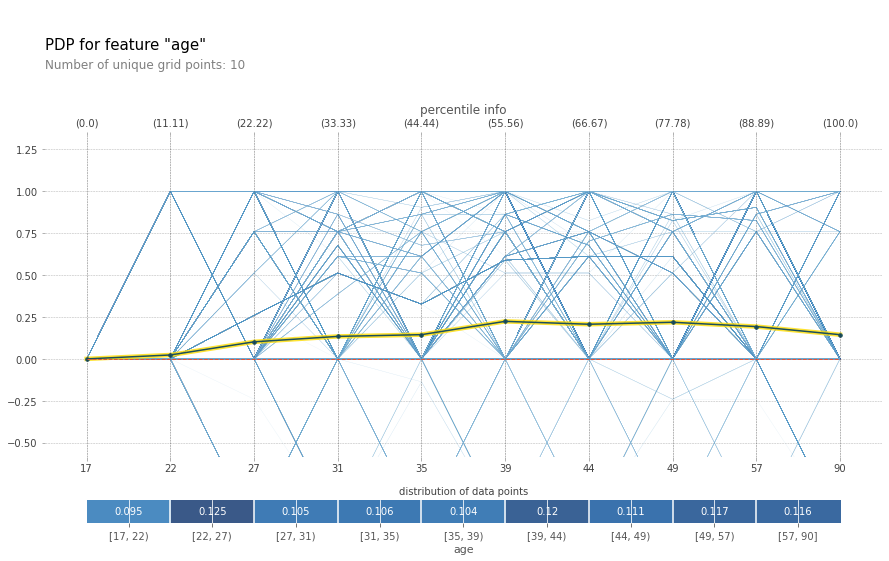

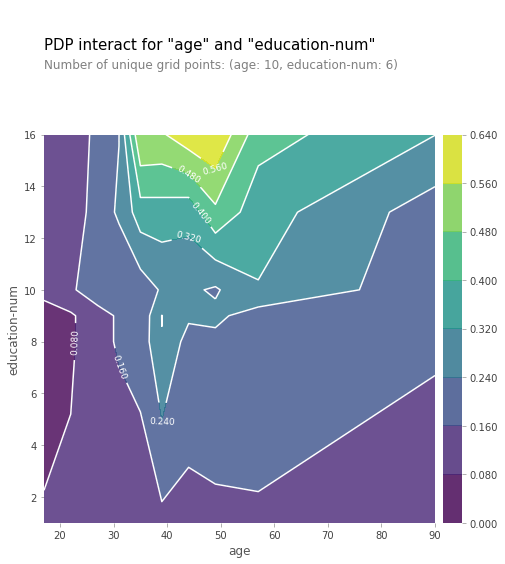

In [9]:
for model in models:
    generate_pdp_plots("PDPBox", model, "age", "None")
    generate_pdp_plots("PDPBox", model, "age", "education-num")

In the two examples below we will use *Skater* and *SHAP* for generating PDPs using features: **age** and **education-num**.

20-Jun-20 17:25:19 - Generating a PDP plot using SKATER for Model 1 ...
2020-06-20 17:25:31,744 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False


[1136/1136] grid cells ████████████████████ Time elapsed: 453 seconds

20-Jun-20 17:33:06 - Generating a PDP plot using SKATER for Model 2 ...
2020-06-20 17:33:18,017 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False


[1136/1136] grid cells ████████████████████ Time elapsed: 526 seconds

20-Jun-20 17:42:04 - Generating a PDP plot using SKATER for Model 3 ...
2020-06-20 17:42:16,384 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False


[1136/1136] grid cells ████████████████████ Time elapsed: 464 seconds

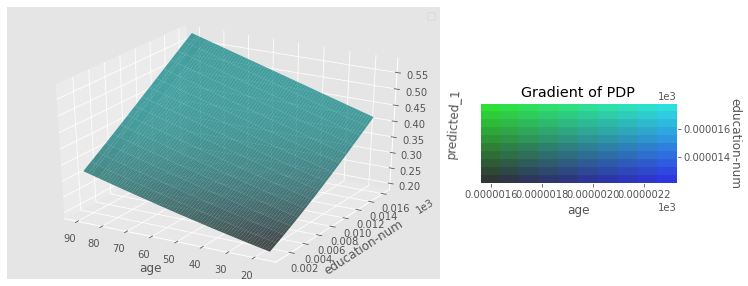

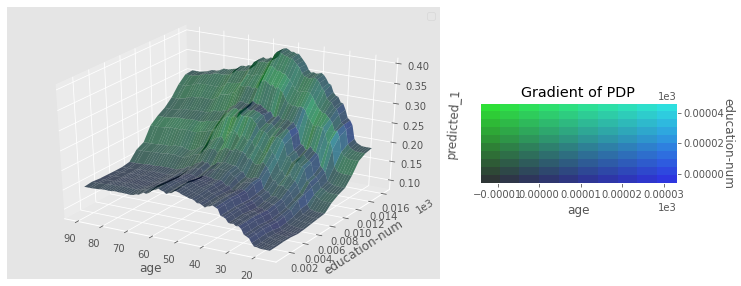

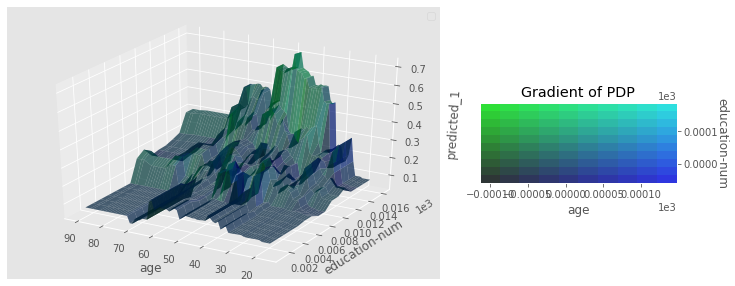

In [10]:
for model in models:
    generate_pdp_plots("SKATER", model, "age", "education-num")

20-Jun-20 17:50:07 - Generating a PDP plot using SHAP for Model 1 ...


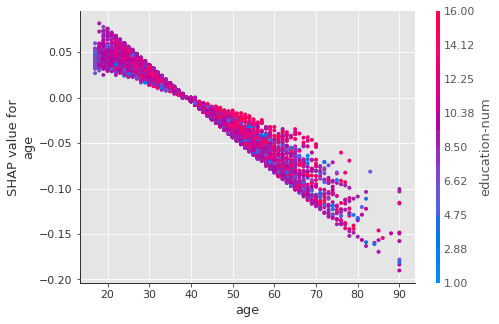

20-Jun-20 17:50:09 - Generating a PDP plot using SHAP for Model 2 ...


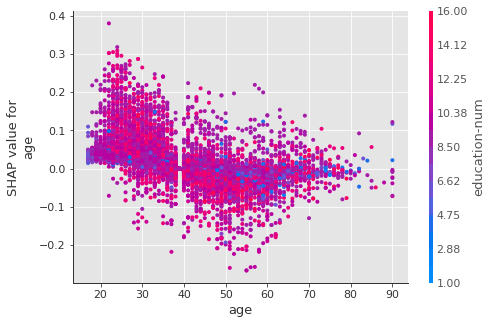

20-Jun-20 17:50:10 - Generating a PDP plot using SHAP for Model 3 ...


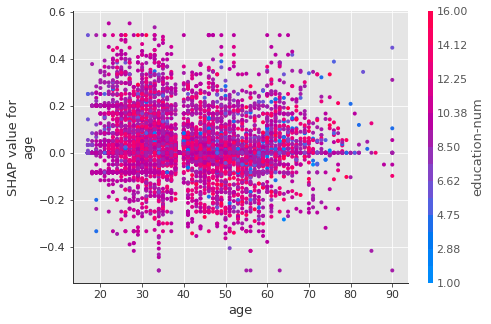

In [11]:
for model in models:
    generate_pdp_plots("SHAP", model, "age", "education-num")

In the cells above, we have used three different modules for plotting PDPs. They use different types of plots but the results look similiar for all models. In conclusion, we can say that without surprise that older (around 60) and more educated people have greater chances of earning more than 50k per year.

## Local model interpretations
Local interpretation focuses on specifics of each individual and provides explanations that can lead to a better understanding of the feature contribution in smaller groups of individuals that are often overlooked by the global interpretation techniques. We will use two moduels for interpreting single instances - SHAP and LIME. Three examples are selected from the test dataset, which are falsley predicted by the first model.

#### SHAP
SHAP leverages the idea of Shapley values for model feature influence scoring. The technical definition of a Shapley value is the “average marginal contribution of a feature value over all possible coalitions.” In other words, Shapley values consider all possible predictions for an instance using all possible combinations of inputs. Because of this exhaustive approach, SHAP can guarantee properties like consistency and local accuracy. LIME, on the other hand, does not offer such guarantees.

#### LIME
[LIME](https://github.com/marcotcr/lime) (Local Interpretable Model-agnostic Explanations) builds sparse linear models around each prediction to explain how the black box model works in that local vicinity. While treating the model as a black box, we perturb the instance we want to explain and learn a sparse linear model around it, as an explanation. LIME has the advantage over *SHAP*, that it is a lot faster.



In [12]:
examples = get_test_examples(models[0], ExampleType.FALSELY_CLASSIFIED, 3)

In this first example we see that only the first model classified the example as '>50k' with a high probability, due to the high *capital-gain* and *material-status=Married-civ-spouse*. 

In [13]:
for model in models:
    explanation = explain_single_instance(model, LocalInterpreterType.LIME, examples[0])
    explanation.show_in_notebook(show_table=True, show_all=True)
    explanation = explain_single_instance(model, LocalInterpreterType.SHAP, examples[0])
    display(explanation)

20-Jun-20 17:50:11 - Explanation for Model 1.
20-Jun-20 17:50:11 - Example 5260's data: 
age                                49
workclass                     Private
education                   Bachelors
education-num                      13
marital-status     Married-civ-spouse
occupation             Prof-specialty
relationship                  Husband
ethnicity                       White
gender                           Male
capital-gain                     5013
capital-loss                        0
hours-per-week                     45
Name: 3912, dtype: object
20-Jun-20 17:50:11 - Model prediction for example 5260:  >50K
20-Jun-20 17:50:11 - Actual result for example 5260:  <=50K 

20-Jun-20 17:50:11 - Initializing LIME - generating new explainer. This operation may be time-consuming so please be patient.


20-Jun-20 17:50:13 - Explanation for Model 1.
20-Jun-20 17:50:13 - Example 5260's data: 
age                                49
workclass                     Private
education                   Bachelors
education-num                      13
marital-status     Married-civ-spouse
occupation             Prof-specialty
relationship                  Husband
ethnicity                       White
gender                           Male
capital-gain                     5013
capital-loss                        0
hours-per-week                     45
Name: 3912, dtype: object
20-Jun-20 17:50:13 - Model prediction for example 5260:  >50K
20-Jun-20 17:50:13 - Actual result for example 5260:  <=50K 



20-Jun-20 17:50:13 - Explanation for Model 2.
20-Jun-20 17:50:13 - Example 5260's data: 
age                                49
workclass                     Private
education                   Bachelors
education-num                      13
marital-status     Married-civ-spouse
occupation             Prof-specialty
relationship                  Husband
ethnicity                       White
gender                           Male
capital-gain                     5013
capital-loss                        0
hours-per-week                     45
Name: 3912, dtype: object
20-Jun-20 17:50:13 - Model prediction for example 5260:  <=50K
20-Jun-20 17:50:13 - Actual result for example 5260:  <=50K 

20-Jun-20 17:50:13 - Initializing LIME - generating new explainer. This operation may be time-consuming so please be patient.


20-Jun-20 17:50:15 - Explanation for Model 2.
20-Jun-20 17:50:15 - Example 5260's data: 
age                                49
workclass                     Private
education                   Bachelors
education-num                      13
marital-status     Married-civ-spouse
occupation             Prof-specialty
relationship                  Husband
ethnicity                       White
gender                           Male
capital-gain                     5013
capital-loss                        0
hours-per-week                     45
Name: 3912, dtype: object
20-Jun-20 17:50:15 - Model prediction for example 5260:  <=50K
20-Jun-20 17:50:15 - Actual result for example 5260:  <=50K 



20-Jun-20 17:50:15 - Explanation for Model 3.
20-Jun-20 17:50:15 - Example 5260's data: 
age                                49
workclass                     Private
education                   Bachelors
education-num                      13
marital-status     Married-civ-spouse
occupation             Prof-specialty
relationship                  Husband
ethnicity                       White
gender                           Male
capital-gain                     5013
capital-loss                        0
hours-per-week                     45
Name: 3912, dtype: object
20-Jun-20 17:50:15 - Model prediction for example 5260:  <=50K
20-Jun-20 17:50:15 - Actual result for example 5260:  <=50K 

20-Jun-20 17:50:15 - Initializing LIME - generating new explainer. This operation may be time-consuming so please be patient.


20-Jun-20 17:50:17 - Explanation for Model 3.
20-Jun-20 17:50:17 - Example 5260's data: 
age                                49
workclass                     Private
education                   Bachelors
education-num                      13
marital-status     Married-civ-spouse
occupation             Prof-specialty
relationship                  Husband
ethnicity                       White
gender                           Male
capital-gain                     5013
capital-loss                        0
hours-per-week                     45
Name: 3912, dtype: object
20-Jun-20 17:50:17 - Model prediction for example 5260:  <=50K
20-Jun-20 17:50:17 - Actual result for example 5260:  <=50K 



The second example is falsely classified by both Model 1 and Model 2. As we can see in the explanations, the examples are falsely classified due to the value (0) of *capital-gain*, which negatively impact the prediction.

In [14]:
for model in models:
    explanation = explain_single_instance(model, LocalInterpreterType.LIME, examples[1])
    explanation.show_in_notebook(show_table=True, show_all=True)
    explanation = explain_single_instance(model, LocalInterpreterType.SHAP, examples[1])
    display(explanation)

20-Jun-20 17:50:17 - Explanation for Model 1.
20-Jun-20 17:50:17 - Example 8169's data: 
age                                51
workclass                     Private
education                   Assoc-voc
education-num                      11
marital-status     Married-civ-spouse
occupation               Craft-repair
relationship                  Husband
ethnicity                       White
gender                           Male
capital-gain                        0
capital-loss                        0
hours-per-week                     57
Name: 30462, dtype: object
20-Jun-20 17:50:17 - Model prediction for example 8169:  >50K
20-Jun-20 17:50:17 - Actual result for example 8169:  <=50K 



20-Jun-20 17:50:19 - Explanation for Model 1.
20-Jun-20 17:50:19 - Example 8169's data: 
age                                51
workclass                     Private
education                   Assoc-voc
education-num                      11
marital-status     Married-civ-spouse
occupation               Craft-repair
relationship                  Husband
ethnicity                       White
gender                           Male
capital-gain                        0
capital-loss                        0
hours-per-week                     57
Name: 30462, dtype: object
20-Jun-20 17:50:19 - Model prediction for example 8169:  >50K
20-Jun-20 17:50:19 - Actual result for example 8169:  <=50K 



20-Jun-20 17:50:19 - Explanation for Model 2.
20-Jun-20 17:50:19 - Example 8169's data: 
age                                51
workclass                     Private
education                   Assoc-voc
education-num                      11
marital-status     Married-civ-spouse
occupation               Craft-repair
relationship                  Husband
ethnicity                       White
gender                           Male
capital-gain                        0
capital-loss                        0
hours-per-week                     57
Name: 30462, dtype: object
20-Jun-20 17:50:19 - Model prediction for example 8169:  >50K
20-Jun-20 17:50:19 - Actual result for example 8169:  <=50K 



20-Jun-20 17:50:21 - Explanation for Model 2.
20-Jun-20 17:50:21 - Example 8169's data: 
age                                51
workclass                     Private
education                   Assoc-voc
education-num                      11
marital-status     Married-civ-spouse
occupation               Craft-repair
relationship                  Husband
ethnicity                       White
gender                           Male
capital-gain                        0
capital-loss                        0
hours-per-week                     57
Name: 30462, dtype: object
20-Jun-20 17:50:21 - Model prediction for example 8169:  >50K
20-Jun-20 17:50:21 - Actual result for example 8169:  <=50K 



20-Jun-20 17:50:21 - Explanation for Model 3.
20-Jun-20 17:50:21 - Example 8169's data: 
age                                51
workclass                     Private
education                   Assoc-voc
education-num                      11
marital-status     Married-civ-spouse
occupation               Craft-repair
relationship                  Husband
ethnicity                       White
gender                           Male
capital-gain                        0
capital-loss                        0
hours-per-week                     57
Name: 30462, dtype: object
20-Jun-20 17:50:21 - Model prediction for example 8169:  <=50K
20-Jun-20 17:50:21 - Actual result for example 8169:  <=50K 



20-Jun-20 17:50:23 - Explanation for Model 3.
20-Jun-20 17:50:23 - Example 8169's data: 
age                                51
workclass                     Private
education                   Assoc-voc
education-num                      11
marital-status     Married-civ-spouse
occupation               Craft-repair
relationship                  Husband
ethnicity                       White
gender                           Male
capital-gain                        0
capital-loss                        0
hours-per-week                     57
Name: 30462, dtype: object
20-Jun-20 17:50:23 - Model prediction for example 8169:  <=50K
20-Jun-20 17:50:23 - Actual result for example 8169:  <=50K 



In the third example we observe an example that is falsely classified only by Model 1. The classifier is mostly influenced by the feature: *capital-loss*.

In [15]:
for model in models:
    explanation = explain_single_instance(model, LocalInterpreterType.LIME, examples[2])
    explanation.show_in_notebook(show_table=True, show_all=True)
    explanation = explain_single_instance(model, LocalInterpreterType.SHAP, examples[2])
    display(explanation)

20-Jun-20 17:50:23 - Explanation for Model 1.
20-Jun-20 17:50:23 - Example 2895's data: 
age                                21
workclass                     Private
education                   Assoc-voc
education-num                      11
marital-status     Married-civ-spouse
occupation               Craft-repair
relationship                  Husband
ethnicity                       White
gender                           Male
capital-gain                        0
capital-loss                     2603
hours-per-week                     40
Name: 17897, dtype: object
20-Jun-20 17:50:23 - Model prediction for example 2895:  >50K
20-Jun-20 17:50:23 - Actual result for example 2895:  <=50K 



20-Jun-20 17:50:25 - Explanation for Model 1.
20-Jun-20 17:50:25 - Example 2895's data: 
age                                21
workclass                     Private
education                   Assoc-voc
education-num                      11
marital-status     Married-civ-spouse
occupation               Craft-repair
relationship                  Husband
ethnicity                       White
gender                           Male
capital-gain                        0
capital-loss                     2603
hours-per-week                     40
Name: 17897, dtype: object
20-Jun-20 17:50:25 - Model prediction for example 2895:  >50K
20-Jun-20 17:50:25 - Actual result for example 2895:  <=50K 



20-Jun-20 17:50:25 - Explanation for Model 2.
20-Jun-20 17:50:25 - Example 2895's data: 
age                                21
workclass                     Private
education                   Assoc-voc
education-num                      11
marital-status     Married-civ-spouse
occupation               Craft-repair
relationship                  Husband
ethnicity                       White
gender                           Male
capital-gain                        0
capital-loss                     2603
hours-per-week                     40
Name: 17897, dtype: object
20-Jun-20 17:50:25 - Model prediction for example 2895:  <=50K
20-Jun-20 17:50:25 - Actual result for example 2895:  <=50K 



20-Jun-20 17:50:27 - Explanation for Model 2.
20-Jun-20 17:50:27 - Example 2895's data: 
age                                21
workclass                     Private
education                   Assoc-voc
education-num                      11
marital-status     Married-civ-spouse
occupation               Craft-repair
relationship                  Husband
ethnicity                       White
gender                           Male
capital-gain                        0
capital-loss                     2603
hours-per-week                     40
Name: 17897, dtype: object
20-Jun-20 17:50:27 - Model prediction for example 2895:  <=50K
20-Jun-20 17:50:27 - Actual result for example 2895:  <=50K 



20-Jun-20 17:50:27 - Explanation for Model 3.
20-Jun-20 17:50:27 - Example 2895's data: 
age                                21
workclass                     Private
education                   Assoc-voc
education-num                      11
marital-status     Married-civ-spouse
occupation               Craft-repair
relationship                  Husband
ethnicity                       White
gender                           Male
capital-gain                        0
capital-loss                     2603
hours-per-week                     40
Name: 17897, dtype: object
20-Jun-20 17:50:27 - Model prediction for example 2895:  <=50K
20-Jun-20 17:50:27 - Actual result for example 2895:  <=50K 



20-Jun-20 17:50:28 - Explanation for Model 3.
20-Jun-20 17:50:28 - Example 2895's data: 
age                                21
workclass                     Private
education                   Assoc-voc
education-num                      11
marital-status     Married-civ-spouse
occupation               Craft-repair
relationship                  Husband
ethnicity                       White
gender                           Male
capital-gain                        0
capital-loss                     2603
hours-per-week                     40
Name: 17897, dtype: object
20-Jun-20 17:50:28 - Model prediction for example 2895:  <=50K
20-Jun-20 17:50:28 - Actual result for example 2895:  <=50K 

